In [ ]:
!pip install pyspark

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.4.0-py2.py3-none-any.whl size=311317145 sha256=4930c6278e6e2b87620bb44accca08c835061d0b4af0a175d97e14222ad799fc
  Stored in directory: /root/.cache/pip/wheels/7b/1b/4b/3363a1d04368e7ff0d408e57ff57966fcdf00583774e761327
Successfully built pyspark


In [ ]:
from pyspark.sql import SparkSession
spark = SparkSession.builder.master('local[*]').getOrCreate()

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
data=spark.read.json("/content/gdrive/MyDrive/PBDM project/Cell_Phones_and_Accessories_5.json")

In [ ]:
data.show(5)

+----------+-----+-------+--------------------+-----------+--------------+----------------+--------------------+--------------------+--------------+--------+----+
|      asin|image|overall|          reviewText| reviewTime|    reviewerID|    reviewerName|               style|             summary|unixReviewTime|verified|vote|
+----------+-----+-------+--------------------+-----------+--------------+----------------+--------------------+--------------------+--------------+--------+----+
|7508492919| null|    5.0|Looks even better...| 08 4, 2014|A24E3SXTC62LJI|Claudia Valdivia|{null,  Bling, nu...|Can't stop won't ...|    1407110400|    true|null|
|7508492919| null|    5.0|When you don't wa...|02 12, 2014|A269FLZCB4GIPV|     sarah ponce|                null|                   1|    1392163200|    true|null|
|7508492919| null|    3.0|so the case came ...| 02 8, 2014| AB6CHQWHZW4TV|             Kai|                null|            Its okay|    1391817600|    true|null|
|7508492919| null|    

In [ ]:
data=data.filter((data.reviewText.isNotNull()) & (data["summary"].isNotNull()))

In [ ]:
data.printSchema()

root
 |-- asin: string (nullable = true)
 |-- image: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- overall: double (nullable = true)
 |-- reviewText: string (nullable = true)
 |-- reviewTime: string (nullable = true)
 |-- reviewerID: string (nullable = true)
 |-- reviewerName: string (nullable = true)
 |-- style: struct (nullable = true)
 |    |-- Color Name:: string (nullable = true)
 |    |-- Color:: string (nullable = true)
 |    |-- Design:: string (nullable = true)
 |    |-- Edition:: string (nullable = true)
 |    |-- Format:: string (nullable = true)
 |    |-- Item Package Quantity:: string (nullable = true)
 |    |-- Length:: string (nullable = true)
 |    |-- Material Type:: string (nullable = true)
 |    |-- Model:: string (nullable = true)
 |    |-- Offer Type:: string (nullable = true)
 |    |-- Package Quantity:: string (nullable = true)
 |    |-- Package Type:: string (nullable = true)
 |    |-- Pattern:: string (nullable = true)
 |    |-- P

In [ ]:
import pyspark.sql.functions as func
data=data.withColumn("reviewText_lower",func.lower(func.col("reviewText")))
data=data.withColumn("summary_lower",func.lower(data["summary"]))


In [ ]:
fdata=data.filter(~data["reviewText_lower"].contains("case"))
fdata=data.filter(~fdata["summary_lower"].contains("case"))
#fdata=data.filter(data)

In [ ]:
fdata.show()

+----------+-----+-------+--------------------+-----------+--------------+------------------+--------------------+--------------------+--------------+--------+----+--------------------+--------------------+
|      asin|image|overall|          reviewText| reviewTime|    reviewerID|      reviewerName|               style|             summary|unixReviewTime|verified|vote|    reviewText_lower|       summary_lower|
+----------+-----+-------+--------------------+-----------+--------------+------------------+--------------------+--------------------+--------------+--------+----+--------------------+--------------------+
|7508492919| null|    5.0|Looks even better...| 08 4, 2014|A24E3SXTC62LJI|  Claudia Valdivia|{null,  Bling, nu...|Can't stop won't ...|    1407110400|    true|null|looks even better...|can't stop won't ...|
|7508492919| null|    5.0|When you don't wa...|02 12, 2014|A269FLZCB4GIPV|       sarah ponce|                null|                   1|    1392163200|    true|null|when you

In [ ]:
col_to_drop=['image','style','vote']
fdata=fdata.drop(*col_to_drop)

In [ ]:
fdata.show()

+----------+-------+--------------------+-----------+--------------+------------------+--------------------+--------------+--------+--------------------+--------------------+
|      asin|overall|          reviewText| reviewTime|    reviewerID|      reviewerName|             summary|unixReviewTime|verified|    reviewText_lower|       summary_lower|
+----------+-------+--------------------+-----------+--------------+------------------+--------------------+--------------+--------+--------------------+--------------------+
|7508492919|    5.0|Looks even better...| 08 4, 2014|A24E3SXTC62LJI|  Claudia Valdivia|Can't stop won't ...|    1407110400|    true|looks even better...|can't stop won't ...|
|7508492919|    5.0|When you don't wa...|02 12, 2014|A269FLZCB4GIPV|       sarah ponce|                   1|    1392163200|    true|when you don't wa...|                   1|
|7508492919|    3.0|so the case came ...| 02 8, 2014| AB6CHQWHZW4TV|               Kai|            Its okay|    1391817600|  

In [ ]:
fdata.printSchema()

root
 |-- asin: string (nullable = true)
 |-- overall: double (nullable = true)
 |-- reviewText: string (nullable = true)
 |-- reviewTime: string (nullable = true)
 |-- reviewerID: string (nullable = true)
 |-- reviewerName: string (nullable = true)
 |-- summary: string (nullable = true)
 |-- unixReviewTime: long (nullable = true)
 |-- verified: boolean (nullable = true)
 |-- reviewText_lower: string (nullable = true)
 |-- summary_lower: string (nullable = true)



In [ ]:
fdata=fdata.filter(fdata.verified==True)

In [ ]:
ddata=fdata.dropDuplicates(["reviewText","reviewTime","reviewerName"])

In [ ]:
ddata.show(15)

+----------+-------+--------------------+-----------+--------------+------------------+--------------------+--------------+--------+--------------------+--------------------+
|      asin|overall|          reviewText| reviewTime|    reviewerID|      reviewerName|             summary|unixReviewTime|verified|    reviewText_lower|       summary_lower|
+----------+-------+--------------------+-----------+--------------+------------------+--------------------+--------------+--------+--------------------+--------------------+
|B00CM0PL1E|    5.0|\nHaving had seve...|12 27, 2011|A12B7ZMXFI6IXY|         Hyoun Kim|[[ UPDATED REVIEW...|    1324944000|    true|\nhaving had seve...|[[ updated review...|
|B00LL8B11W|    5.0|       \nIt prote...|09 20, 2015| ASA22I82GXJH0|         badrsaedi|...      It prote...|    1442707200|    true|       \nit prote...|...      it prote...|
|B00PZDHAUA|    5.0|       \nVery nic...|09 20, 2015| ASA22I82GXJH0|         badrsaedi|        Very nice...|    1442707200|  

In [ ]:
ddata.count()

801938

In [ ]:
import re

In [ ]:
from pyspark.sql.functions import regexp_replace
ddata=ddata.withColumn("reviewText",regexp_replace("reviewText", "\n", ""))
ddata=ddata.withColumn("reviewText_lower",regexp_replace("reviewText_lower", "\n", ""))

In [ ]:
ddata.show()

+----------+-------+--------------------+-----------+--------------+------------------+--------------------+--------------+--------+--------------------+--------------------+
|      asin|overall|          reviewText| reviewTime|    reviewerID|      reviewerName|             summary|unixReviewTime|verified|    reviewText_lower|       summary_lower|
+----------+-------+--------------------+-----------+--------------+------------------+--------------------+--------------+--------+--------------------+--------------------+
|B00CM0PL1E|    5.0|Having had severa...|12 27, 2011|A12B7ZMXFI6IXY|         Hyoun Kim|[[ UPDATED REVIEW...|    1324944000|    true|having had severa...|[[ updated review...|
|B00LL8B11W|    5.0|       It protect...|09 20, 2015| ASA22I82GXJH0|         badrsaedi|...      It prote...|    1442707200|    true|       it protect...|...      it prote...|
|B00PZDHAUA|    5.0|       Very nice ...|09 20, 2015| ASA22I82GXJH0|         badrsaedi|        Very nice...|    1442707200|  

In [ ]:
ddata.count()

801938

In [ ]:
ddata=ddata.toPandas()

-------------------

In [ ]:
ddata.drop(['reviewText','summary'],axis=1)

In [ ]:
def strippunc(data):
    p = re.compile(r'[?|!|\'|"|#|.|,|)|(|\|/|~|%|*]')
    return p.sub('',data)
ddata['reviewText_lower']=ddata['reviewText_lower'].map(strippunc)
ddata['summary_lower']=ddata['summary_lower'].map(strippunc)

In [ ]:
"""p=re.compile(r'[?|!|\'|"|#|.|,|)|(|\|/|~|%|*]')
puncdata=ddata.rdd.map(lambda x: p.sub('',x["reviewText_lower"]))
puncdata=ddata.rdd.map(lambda x: p.sub('',x["reviewText"]))"""

In [ ]:
ddata.head()

In [ ]:
import nltk
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
stop=stopwords.words('english')
excluding=['against','not','don', "don't",'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't",
             'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't",
             'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't",'shouldn', "shouldn't", 'wasn',
             "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]
stop=[words for words in stop if words not in excluding]

In [ ]:
from nltk.stem import SnowballStemmer
snow=SnowballStemmer('english')

In [ ]:
def preprocessText(text, stem=False):
  filtered_sentence=[]
  final_string=[]
  text=strippunc(text)
  for w in text.split():
    if(w.isalpha() and (len(w) > 2)):
      if(w.lower() not in stop):
        if stem :
          s=(snow.stem(w.lower())).encode('utf8')
        else:
          s = (w.lower()).encode('utf8')
        filtered_sentence.append(s)
      else:
        continue
    else:
      continue
  cleanedText = b" ".join(filtered_sentence)
  final_string.append(cleanedText)
  return final_string

In [ ]:
ddata['reviewText_lower']=ddata['reviewText_lower'].map(preprocessText)

In [ ]:
ddata.head()

In [ ]:
def decode(text):
  return text[0].decode('utf-8')

In [ ]:
ddata['reviewText_lower']=ddata['reviewText_lower'].map(decode)

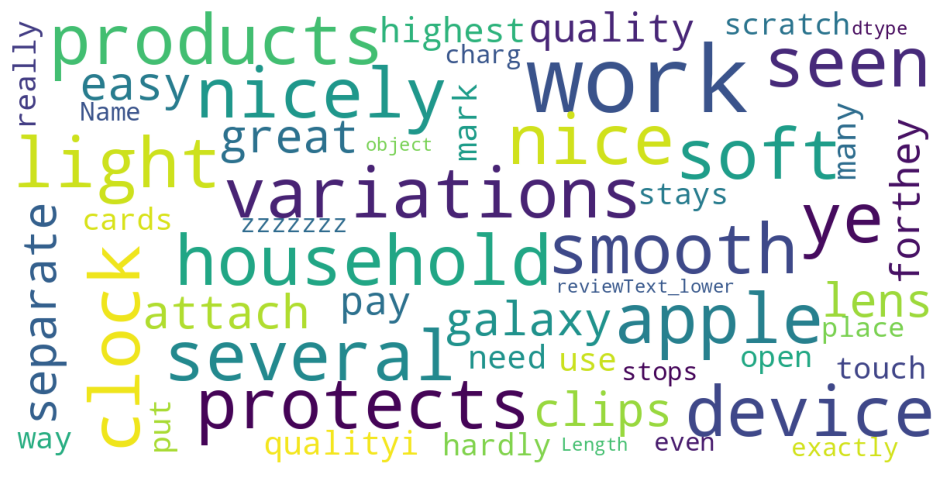

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
stopwords=set(STOPWORDS)
def show_wordcloud(data,title = None):
  wordcloud=WordCloud(background_color='white',stopwords=stopwords,max_words=100,max_font_size=40,scale=3,random_state=1).generate(str(data))
  fig=plt.figure(1,figsize=(12,10))
  plt.axis('off')
  if title:
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
  plt.imshow(wordcloud)
  plt.show()

show_wordcloud(ddata['reviewText_lower'])

In [ ]:
nltk.download()



NLTK Downloader
---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> vader_lexicon



---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> q


True

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
def NaiveBaiyes_Sentimental(sentence):
    blob = TextBlob(sentence, analyzer=NaiveBayesAnalyzer())
    NaiveBayes_SentimentScore=blob.sentiment.classification
    return NaiveBayes_SentimentScore

def sentimental(sentence):
    analyzer = SentimentIntensityAnalyzer()
    vs = analyzer.polarity_scores(sentence)
    score=vs['compound']
    return score

def sentimental_Score(sentence):
    analyzer = SentimentIntensityAnalyzer()
    vs = analyzer.polarity_scores(sentence)
    score=vs['compound']
    if score >= 0.5:
        return 'pos'
    elif (score > -0.5) and (score < 0.5):
        return 'neu'
    elif score <= -0.5:
        return 'neg'

In [ ]:
ddata['sentiment']=ddata['reviewText_lower'].map(sentimental_Score)

In [ ]:
ddata.to_csv('/content/gdrive/MyDrive/PBDM project/result2.csv')

In [ ]:
import pandas as pd
ddata=pd.read_csv('/content/gdrive/MyDrive/PBDM project/result.csv')

In [ ]:
ddata.head()

,Unnamed: 0,asin,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime,verified,reviewText_lower,summary_lower,sentiment
0,0,B00CM0PL1E,5.0,Having had several variations of Apple product...,"12 27, 2011",A12B7ZMXFI6IXY,Hyoun Kim,[[ UPDATED REVIEW - 7/15/2013 ]] High Quality ...,1324944000,True,several variations apple products household ye...,[[ updated review - 7152013 ]] high quality ca...,pos
1,1,B00LL8B11W,5.0,It protects the device nicely and is so...,"09 20, 2015",ASA22I82GXJH0,badrsaedi,... It protects the device nicely and is ...,1442707200,True,protects device nicely soft smooth,it protects the device nicely and is sof...,pos
2,2,B00PZDHAUA,5.0,Very nice and light so that can not be ...,"09 20, 2015",ASA22I82GXJH0,badrsaedi,Very nice and light so that can not be...,1442707200,True,nice light not seen clock,very nice and light so that can not be...,neu
3,3,B00DUCB65I,5.0,4 3 it's ok on my galaxy note4 and 3,"10 30, 2016",A27HDEA6NL1WPO,sami,Five Stars,1477785600,True,galaxy,five stars,neu
4,4,B018GCZWWE,5.0,"Separate clips for each lens, easy to attach...","06 26, 2016",AX8OVRMMVWB8Y,Jim D,Take in the big picture or get into the fine d...,1466899200,True,separate clips lens easy attach great quality ...,take in the big picture or get into the fine d...,pos


In [ ]:
#ndf=ddata.iloc[:,[2,10,12]]
ndf=ddata.iloc[:,[10,12]]

In [ ]:
ndf.head()

,reviewText_lower,sentiment
0,several variations apple products household ye...,pos
1,protects device nicely soft smooth,pos
2,nice light not seen clock,neu
3,galaxy,neu
4,separate clips lens easy attach great quality ...,pos


In [ ]:
from pyspark.sql.types import *
sch= StructType([
    StructField("reviewText_lower", StringType(), True),
    StructField("sentiment",StringType(), True)])

In [ ]:
from pyspark.sql.types import StructType, IntegerType, StringType
spdf=spark.createDataFrame(ndf,schema=sch)

In [ ]:
spdf.show()

+--------------------+---------+
|    reviewText_lower|sentiment|
+--------------------+---------+
|several variation...|      pos|
|protects device n...|      pos|
|nice light not se...|      neu|
|              galaxy|      neu|
|separate clips le...|      pos|
|great products go...|      pos|
|usually strap arm...|      pos|
|             perfect|      pos|
|             perfect|      pos|
|fits great boyfri...|      pos|
|                good|      neu|
|good case wear te...|      pos|
|                love|      pos|
|like house protec...|      pos|
|  wonderfulwonderful|      neu|
|usb car charger t...|      neu|
|anker top quality...|      pos|
|beast best friend...|      pos|
|due curve screen ...|      neu|
|           good item|      neu|
+--------------------+---------+
only showing top 20 rows



In [ ]:
#ddata.where(ddata["sentiment"]=="pos",inplace = True)


In [ ]:
poscloud=spdf.filter(spdf.sentiment=='pos')
poscloud=poscloud.toPandas()
show_wordcloud(poscloud['reviewText_lower'])

In [ ]:
neucloud=spdf.filter(spdf.sentiment=='neu')
neucloud=neucloud.toPandas()
show_wordcloud(neucloud['reviewText_lower'])

In [ ]:
negcloud=spdf.filter(spdf.sentiment=='neg')
negcloud=negcloud.toPandas()
show_wordcloud(negcloud['reviewText_lower'])

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
def NaiveBaiyes_Sentimental(sentence):
    blob = TextBlob(sentence, analyzer=NaiveBayesAnalyzer())
    NaiveBayes_SentimentScore=blob.sentiment.classification
    return NaiveBayes_SentimentScore

def sentimental(sentence):
    analyzer = SentimentIntensityAnalyzer()
    vs = analyzer.polarity_scores(sentence)
    score=vs['compound']
    return score

def sentimental_Score_only(sentence):
    sentence=str(sentence)
    analyzer = SentimentIntensityAnalyzer()
    vs = analyzer.polarity_scores(sentence)
    score=vs['compound']
    return score

In [ ]:
ddata['sentiment_score']=ddata['reviewText_lower'].map(sentimental_Score_only)

In [ ]:
ddata.to_csv('/content/gdrive/MyDrive/PBDM project/score_result_last2.csv')

NameError: ignored

In [ ]:
ddata.head()

,Unnamed: 0,asin,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime,verified,reviewText_lower,summary_lower,sentiment,sentiment_score
0,0,B00CM0PL1E,5.0,Having had several variations of Apple product...,"12 27, 2011",A12B7ZMXFI6IXY,Hyoun Kim,[[ UPDATED REVIEW - 7/15/2013 ]] High Quality ...,1324944000,True,several variations apple products household ye...,[[ updated review - 7152013 ]] high quality ca...,pos,0.9898
1,1,B00LL8B11W,5.0,It protects the device nicely and is so...,"09 20, 2015",ASA22I82GXJH0,badrsaedi,... It protects the device nicely and is ...,1442707200,True,protects device nicely soft smooth,it protects the device nicely and is sof...,pos,0.6369
2,2,B00PZDHAUA,5.0,Very nice and light so that can not be ...,"09 20, 2015",ASA22I82GXJH0,badrsaedi,Very nice and light so that can not be...,1442707200,True,nice light not seen clock,very nice and light so that can not be...,neu,0.4215
3,3,B00DUCB65I,5.0,4 3 it's ok on my galaxy note4 and 3,"10 30, 2016",A27HDEA6NL1WPO,sami,Five Stars,1477785600,True,galaxy,five stars,neu,0.0000
4,4,B018GCZWWE,5.0,"Separate clips for each lens, easy to attach...","06 26, 2016",AX8OVRMMVWB8Y,Jim D,Take in the big picture or get into the fine d...,1466899200,True,separate clips lens easy attach great quality ...,take in the big picture or get into the fine d...,pos,0.9862


**Analysis**

In [ ]:
import pandas as pd
df=pd.read_csv("/content/gdrive/MyDrive/PBDM project/score_result.csv")

In [ ]:
df.head()

,Unnamed: 0.1,Unnamed: 0,asin,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime,verified,reviewText_lower,summary_lower,sentiment,sentiment_score
0,0,0,B00CM0PL1E,5.0,Having had several variations of Apple product...,"12 27, 2011",A12B7ZMXFI6IXY,Hyoun Kim,[[ UPDATED REVIEW - 7/15/2013 ]] High Quality ...,1324944000,True,several variations apple products household ye...,[[ updated review - 7152013 ]] high quality ca...,pos,0.9898
1,1,1,B00LL8B11W,5.0,It protects the device nicely and is so...,"09 20, 2015",ASA22I82GXJH0,badrsaedi,... It protects the device nicely and is ...,1442707200,True,protects device nicely soft smooth,it protects the device nicely and is sof...,pos,0.6369
2,2,2,B00PZDHAUA,5.0,Very nice and light so that can not be ...,"09 20, 2015",ASA22I82GXJH0,badrsaedi,Very nice and light so that can not be...,1442707200,True,nice light not seen clock,very nice and light so that can not be...,neu,0.4215
3,3,3,B00DUCB65I,5.0,4 3 it's ok on my galaxy note4 and 3,"10 30, 2016",A27HDEA6NL1WPO,sami,Five Stars,1477785600,True,galaxy,five stars,neu,0.0000
4,4,4,B018GCZWWE,5.0,"Separate clips for each lens, easy to attach...","06 26, 2016",AX8OVRMMVWB8Y,Jim D,Take in the big picture or get into the fine d...,1466899200,True,separate clips lens easy attach great quality ...,take in the big picture or get into the fine d...,pos,0.9862


In [ ]:
ndf=df.iloc[:,[3,11,13,14]]

In [ ]:
from pyspark.sql.types import *
sch= StructType([
    StructField("overall",DoubleType(),True),
    StructField("reviewText_lower", StringType(), True),
    StructField("sentiment",StringType(), True),
    StructField("sentiment_score",DoubleType(),True)])

In [ ]:
from pyspark.sql.types import StructType, IntegerType, StringType
spdf=spark.createDataFrame(ndf,schema=sch)

In [ ]:
cameracount=spdf.filter(spdf["reviewText_lower"].contains("camera")).count()
screencount=spdf.filter(spdf["reviewText_lower"].contains("screen")).count()
batterycount=spdf.filter(spdf["reviewText_lower"].contains("battery")).count()
speakercount=spdf.filter(spdf["reviewText_lower"].contains("speaker")).count()
connectivitycount=spdf.filter(spdf["reviewText_lower"].contains("connectivity")).count()
storagecount=spdf.filter(spdf["reviewText_lower"].contains("storage")).count()
ramcount=spdf.filter(spdf["reviewText_lower"].contains("ram")).count()

In [ ]:
print(cameracount,screencount,batterycount,speakercount,connectivitycount,storagecount,ramcount)

13980 93284 37194 7782 468 2068 5673


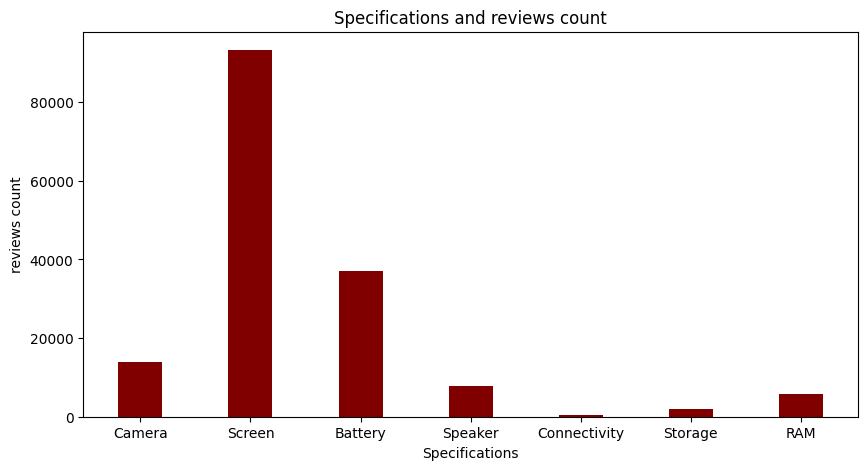

In [ ]:
import matplotlib.pyplot as plt
specdata={'Camera':cameracount,'Screen':screencount,'Battery':batterycount,'Speaker':speakercount,'Connectivity':connectivitycount,'Storage':storagecount,'RAM':ramcount}
specs=list(specdata.keys())
count=list(specdata.values())
fig=plt.figure(figsize=(10,5))
plt.bar(specs,count,color='maroon',width=0.4)
plt.xlabel("Specifications")
plt.ylabel("reviews count")
plt.title("Specifications and reviews count")
plt.show()

In [ ]:
camerareviews=spdf.filter(spdf["reviewText_lower"].contains("camera"))
screenreviews=spdf.filter(spdf["reviewText_lower"].contains("screen"))
batteryreviews=spdf.filter(spdf["reviewText_lower"].contains("battery"))
speakerreviews=spdf.filter(spdf["reviewText_lower"].contains("speaker"))
connectivityreviews=spdf.filter(spdf["reviewText_lower"].contains("connectivity"))
storagereviews=spdf.filter(spdf["reviewText_lower"].contains("storage"))
ramreviews=spdf.filter(spdf["reviewText_lower"].contains("ram"))

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
stopwords=set(STOPWORDS)
def show_wordcloud(data,title = None):
  wordcloud=WordCloud(background_color='white',stopwords=stopwords,max_words=100,max_font_size=40,scale=3,random_state=1).generate(str(data))
  fig=plt.figure(1,figsize=(12,10))
  plt.axis('off')
  if title:
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
  plt.imshow(wordcloud)
  plt.show()

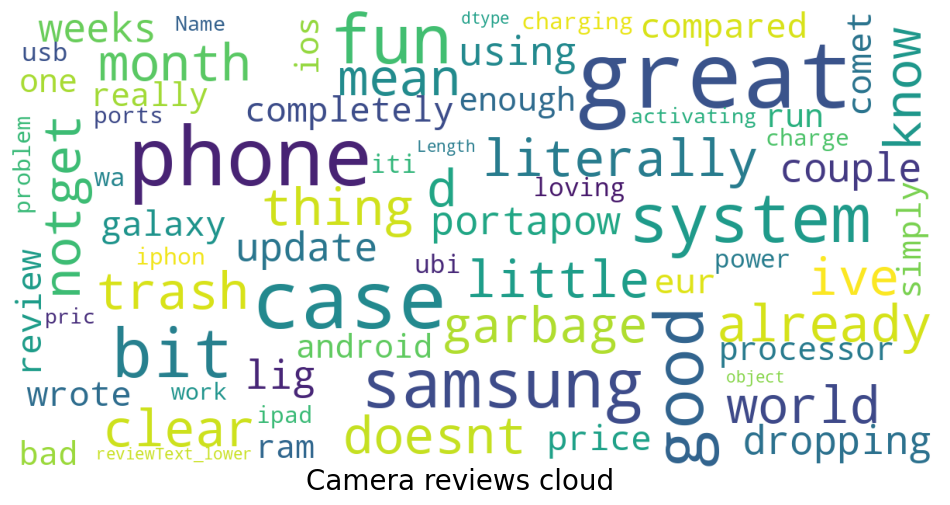

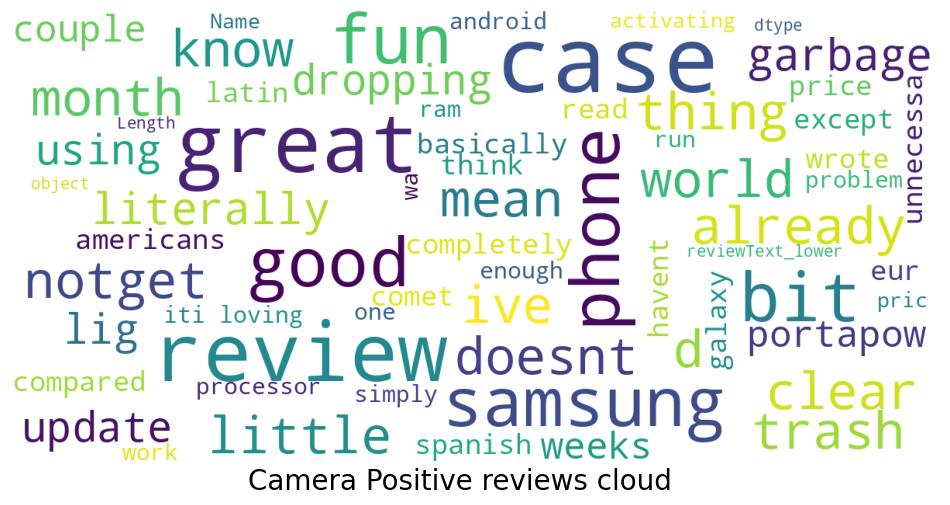

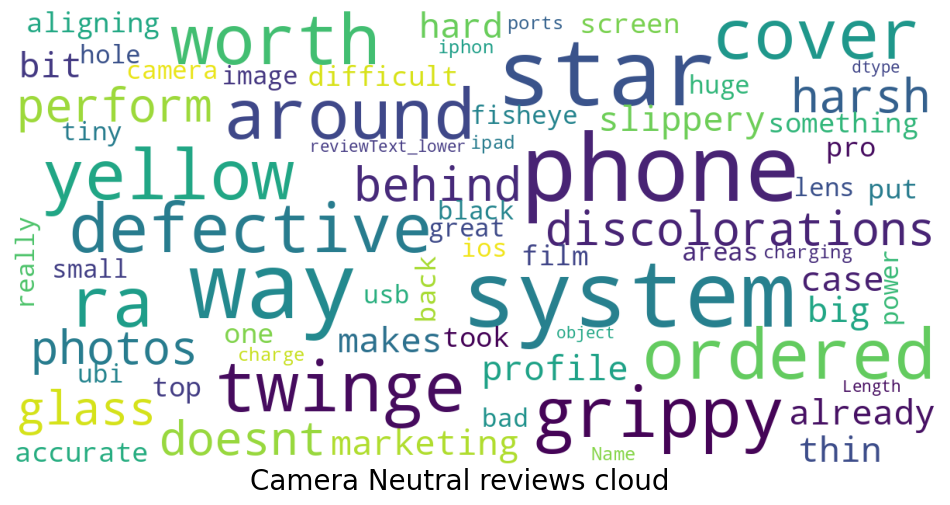

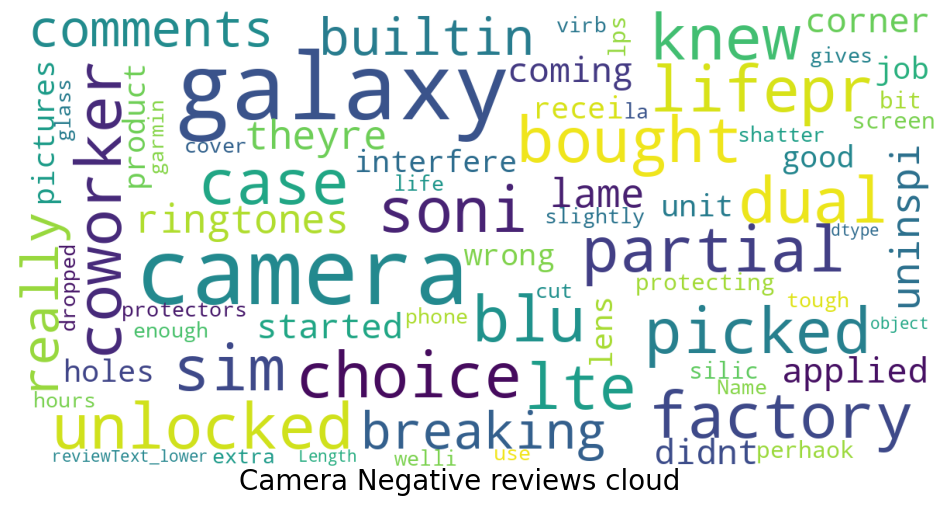

In [ ]:
cameracloud=camerareviews.toPandas()
show_wordcloud(cameracloud['reviewText_lower'],title="Camera reviews cloud")
poscameracloud=camerareviews.filter(spdf.sentiment=='pos')
poscameracloud=poscameracloud.toPandas()
show_wordcloud(poscameracloud['reviewText_lower'],title="Camera Positive reviews cloud")
neucameracloud=camerareviews.filter(spdf.sentiment=='neu')
neucameracloud=neucameracloud.toPandas()
show_wordcloud(neucameracloud['reviewText_lower'],title="Camera Neutral reviews cloud")
negcameracloud=camerareviews.filter(spdf.sentiment=='neg')
negcameracloud=negcameracloud.toPandas()
show_wordcloud(negcameracloud['reviewText_lower'],title="Camera Negative reviews cloud")

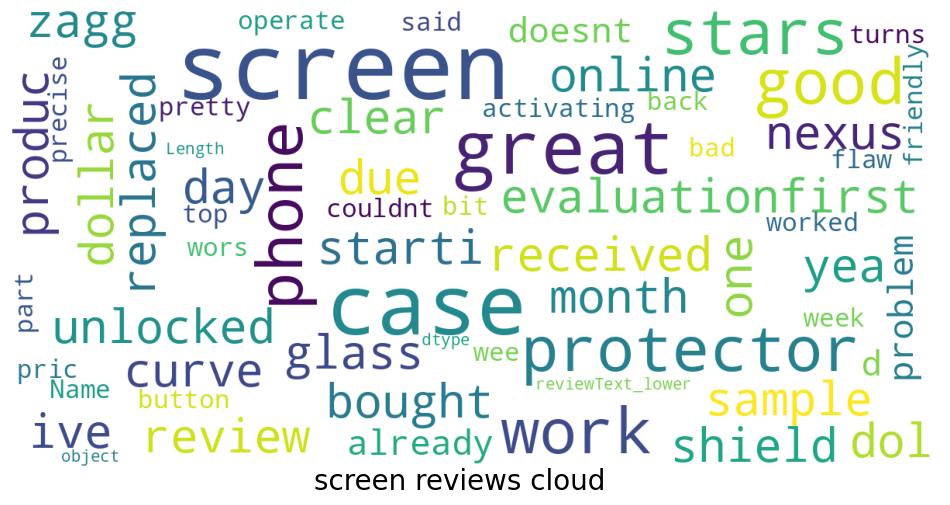

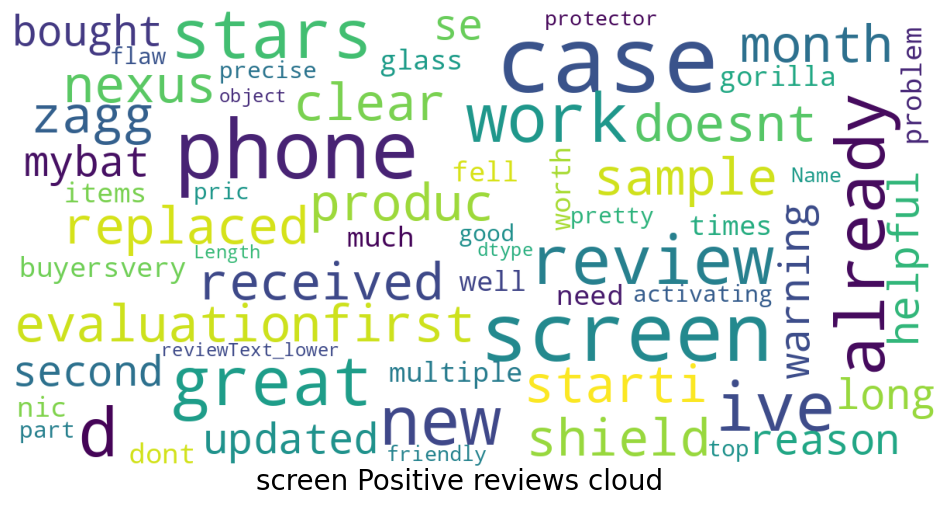

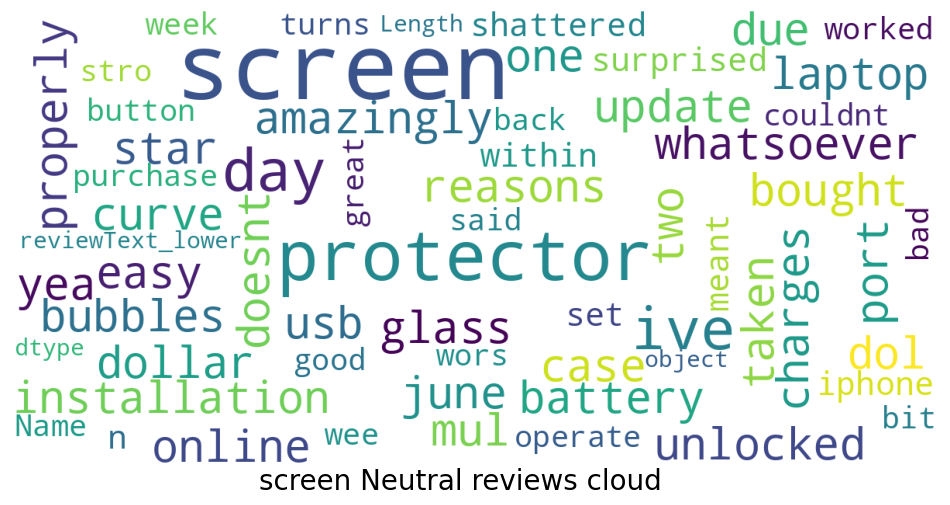

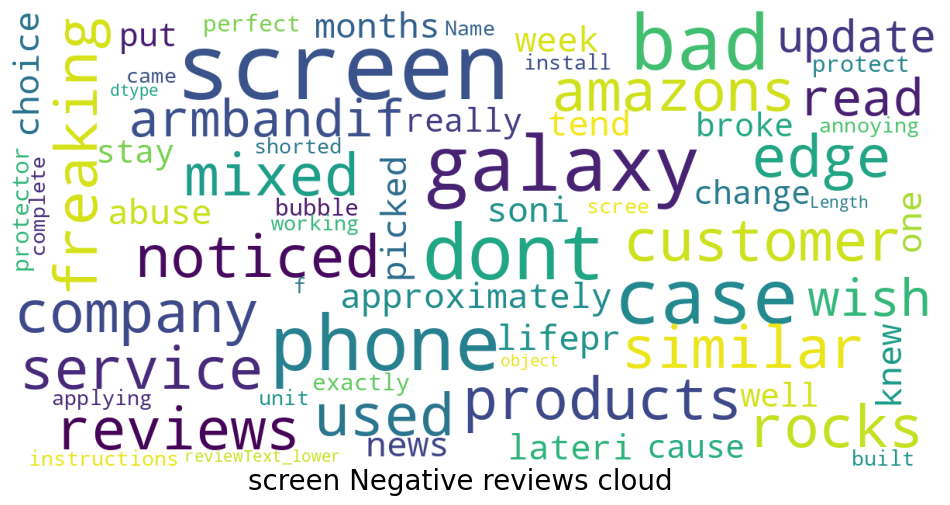

In [ ]:
screencloud=screenreviews.toPandas()
show_wordcloud(screencloud['reviewText_lower'],title="screen reviews cloud")
posscreencloud=screenreviews.filter(spdf.sentiment=='pos')
posscreencloud=posscreencloud.toPandas()
show_wordcloud(posscreencloud['reviewText_lower'],title="screen Positive reviews cloud")
neuscreencloud=screenreviews.filter(spdf.sentiment=='neu')
neuscreencloud=neuscreencloud.toPandas()
show_wordcloud(neuscreencloud['reviewText_lower'],title="screen Neutral reviews cloud")
negscreencloud=screenreviews.filter(spdf.sentiment=='neg')
negscreencloud=negscreencloud.toPandas()
show_wordcloud(negscreencloud['reviewText_lower'],title="screen Negative reviews cloud")

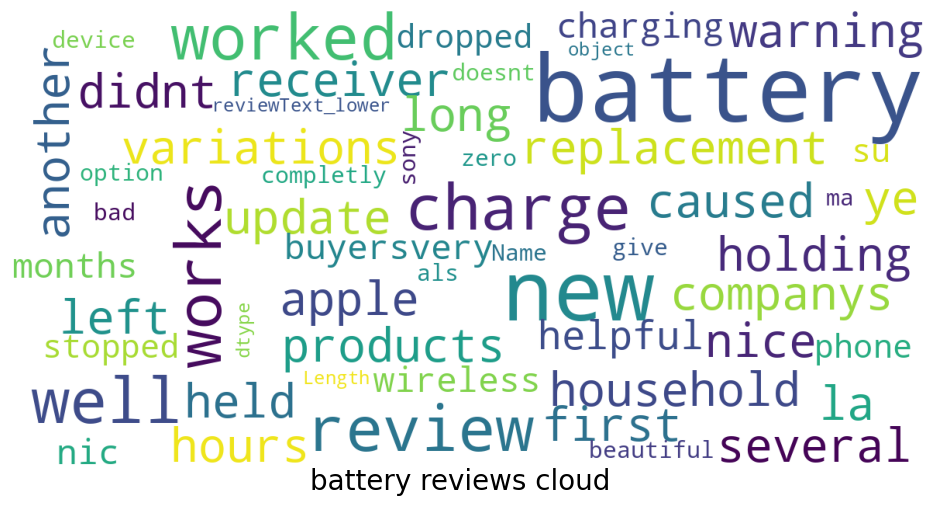

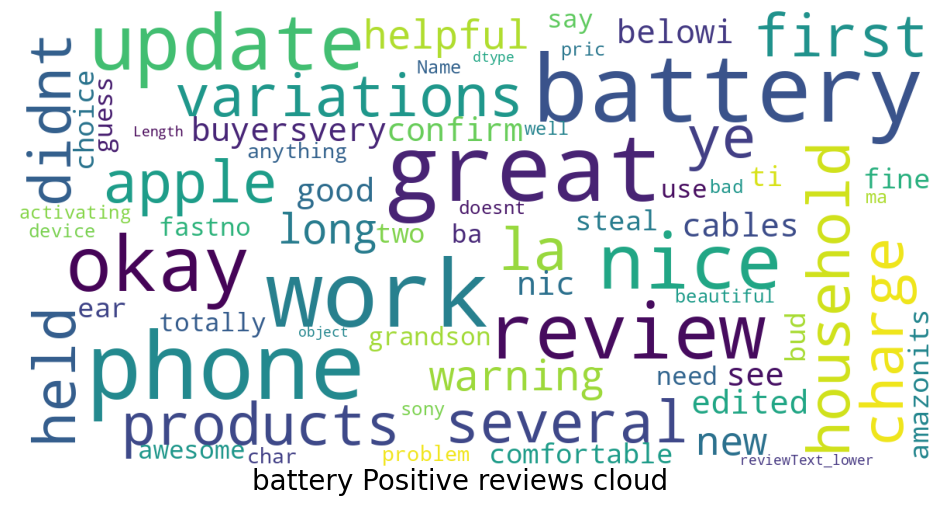

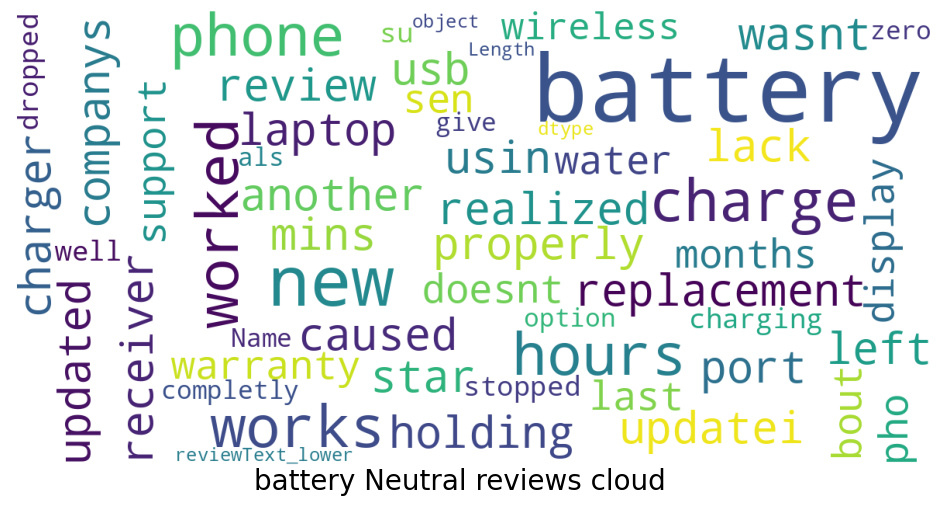

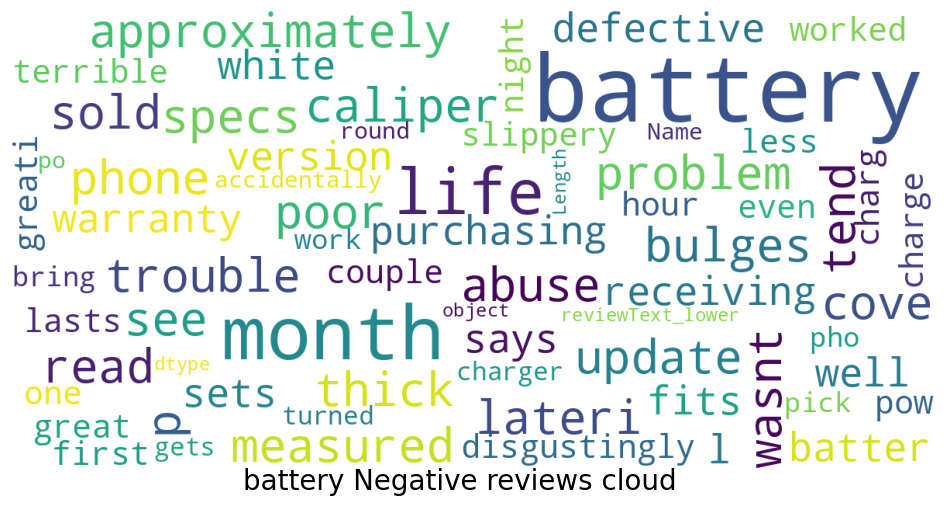

In [ ]:
batterycloud=batteryreviews.toPandas()
show_wordcloud(batterycloud['reviewText_lower'],title="battery reviews cloud")
posbatterycloud=batteryreviews.filter(spdf.sentiment=='pos')
posbatterycloud=posbatterycloud.toPandas()
show_wordcloud(posbatterycloud['reviewText_lower'],title="battery Positive reviews cloud")
neubatterycloud=batteryreviews.filter(spdf.sentiment=='neu')
neubatterycloud=neubatterycloud.toPandas()
show_wordcloud(neubatterycloud['reviewText_lower'],title="battery Neutral reviews cloud")
negbatterycloud=batteryreviews.filter(spdf.sentiment=='neg')
negbatterycloud=negbatterycloud.toPandas()
show_wordcloud(negbatterycloud['reviewText_lower'],title="battery Negative reviews cloud")

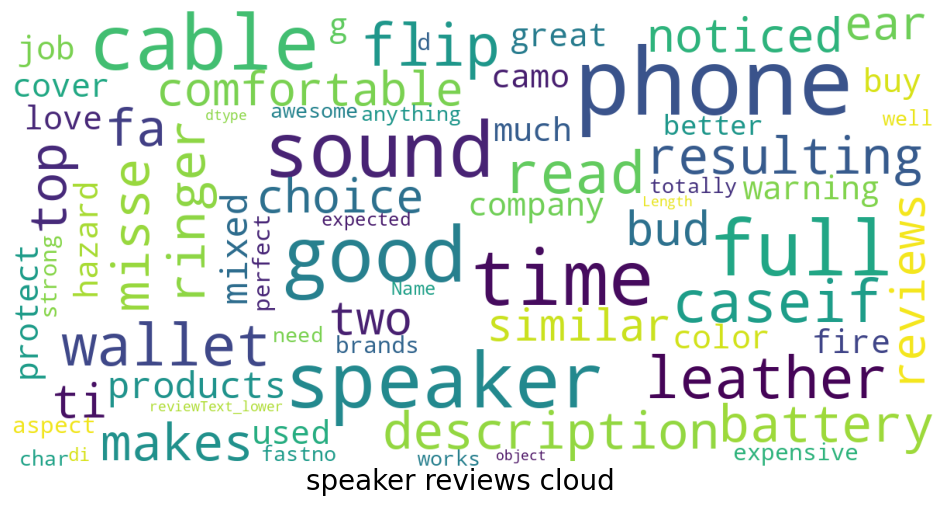

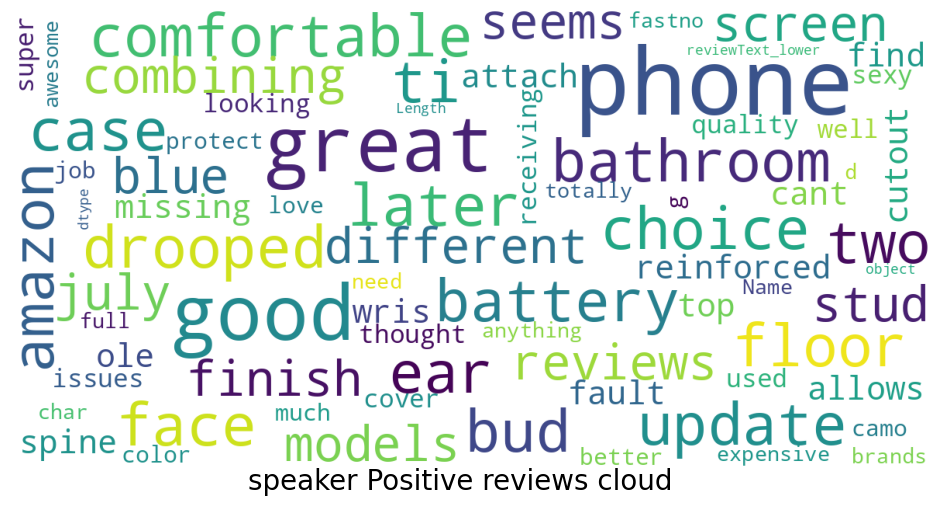

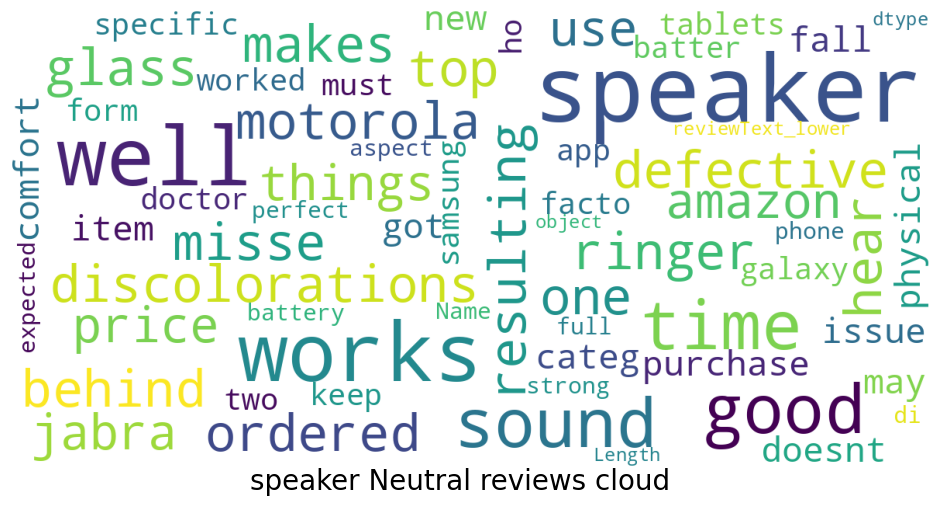

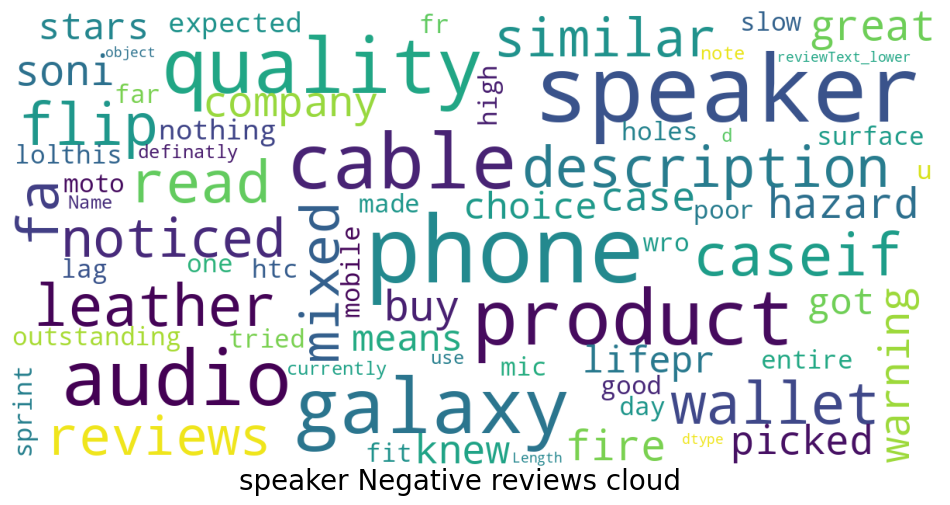

In [ ]:
speakercloud=speakerreviews.toPandas()
show_wordcloud(speakercloud['reviewText_lower'],title="speaker reviews cloud")
posspeakercloud=speakerreviews.filter(spdf.sentiment=='pos')
posspeakercloud=posspeakercloud.toPandas()
show_wordcloud(posspeakercloud['reviewText_lower'],title="speaker Positive reviews cloud")
neuspeakercloud=speakerreviews.filter(spdf.sentiment=='neu')
neuspeakercloud=neuspeakercloud.toPandas()
show_wordcloud(neuspeakercloud['reviewText_lower'],title="speaker Neutral reviews cloud")
negspeakercloud=speakerreviews.filter(spdf.sentiment=='neg')
negspeakercloud=negspeakercloud.toPandas()
show_wordcloud(negspeakercloud['reviewText_lower'],title="speaker Negative reviews cloud")

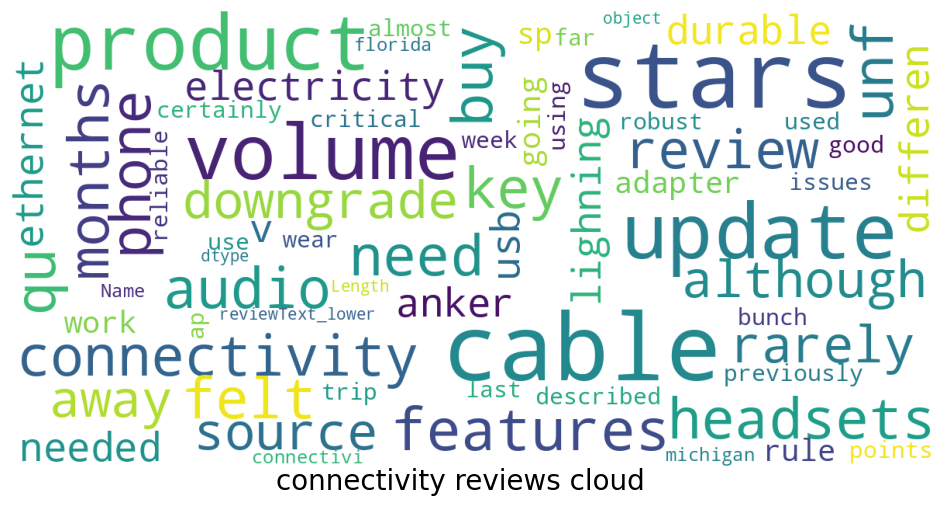

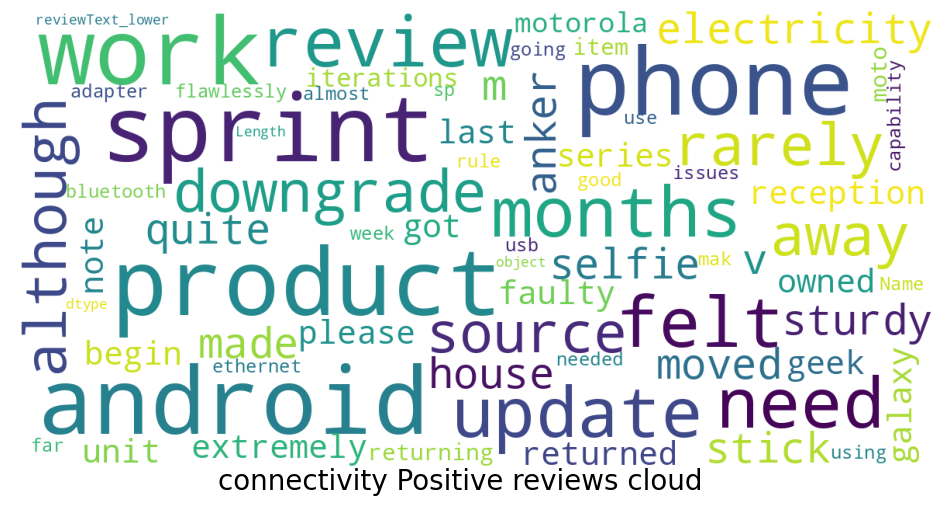

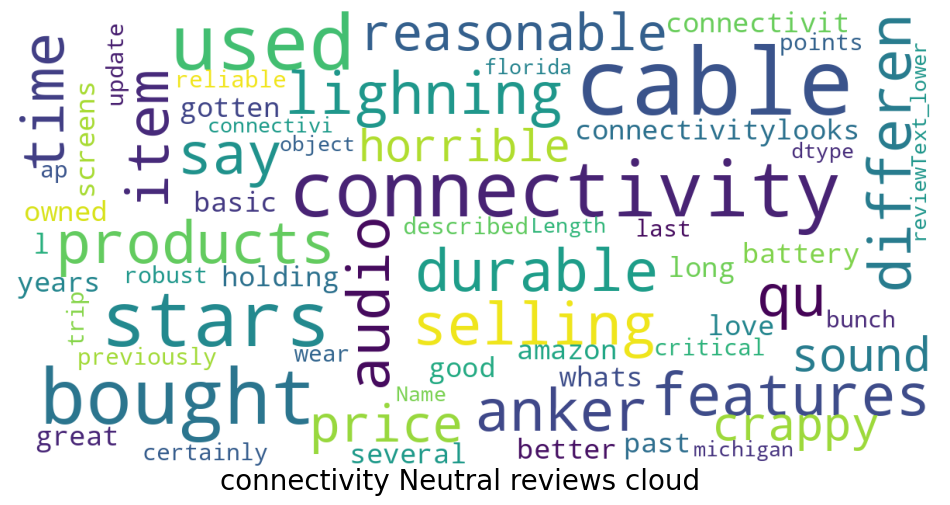

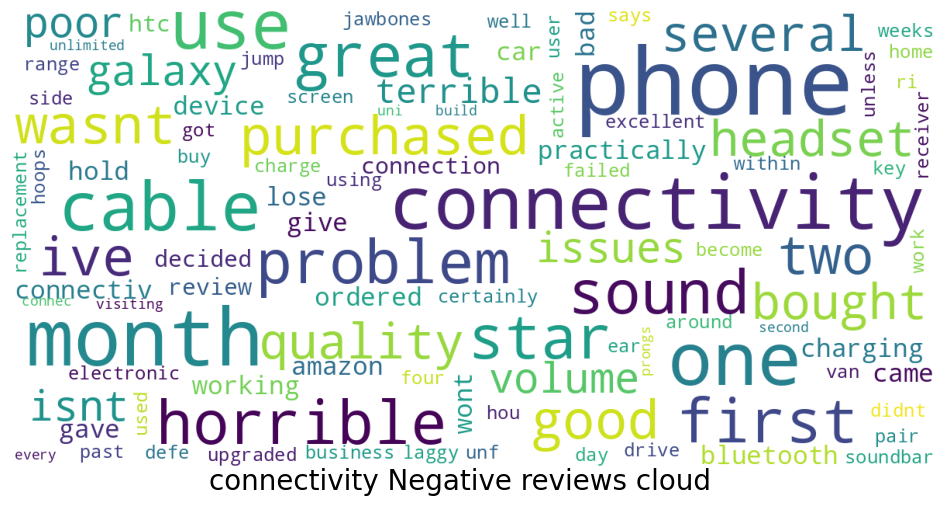

In [ ]:
connectivitycloud=connectivityreviews.toPandas()
show_wordcloud(connectivitycloud['reviewText_lower'],title="connectivity reviews cloud")
posconnectivitycloud=connectivityreviews.filter(spdf.sentiment=='pos')
posconnectivitycloud=posconnectivitycloud.toPandas()
show_wordcloud(posconnectivitycloud['reviewText_lower'],title="connectivity Positive reviews cloud")
neuconnectivitycloud=connectivityreviews.filter(spdf.sentiment=='neu')
neuconnectivitycloud=neuconnectivitycloud.toPandas()
show_wordcloud(neuconnectivitycloud['reviewText_lower'],title="connectivity Neutral reviews cloud")
negconnectivitycloud=connectivityreviews.filter(spdf.sentiment=='neg')
negconnectivitycloud=negconnectivitycloud.toPandas()
show_wordcloud(negconnectivitycloud['reviewText_lower'],title="connectivity Negative reviews cloud")

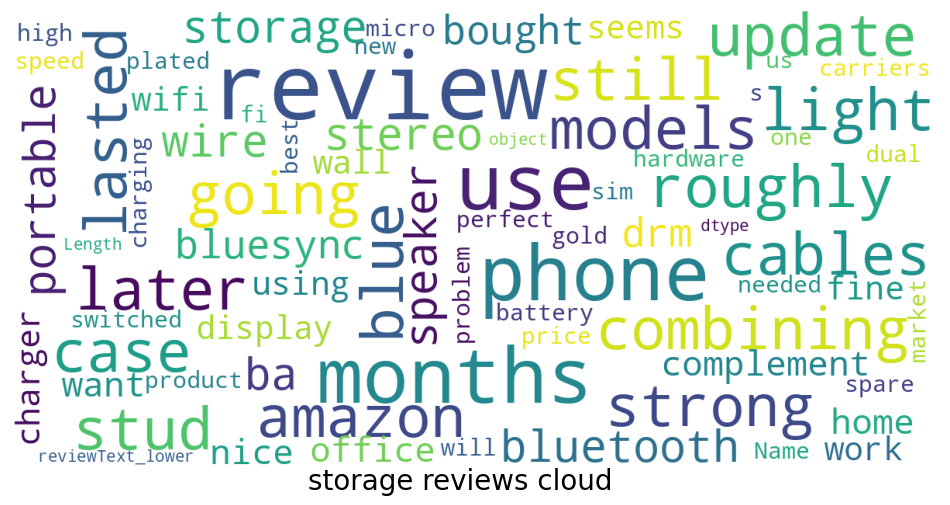

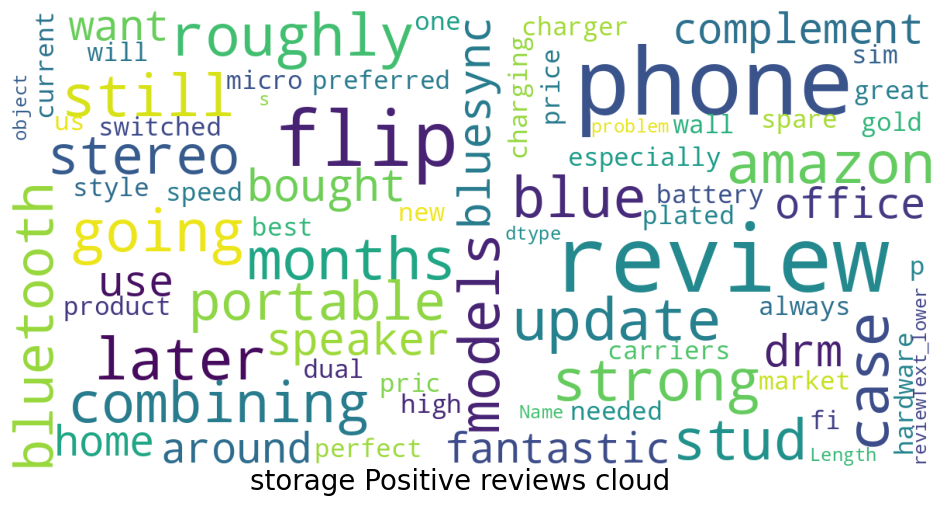

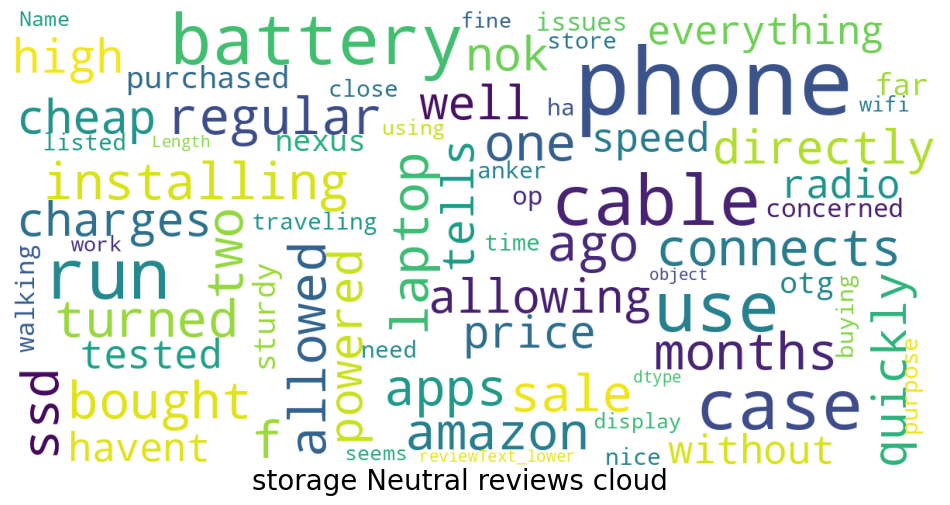

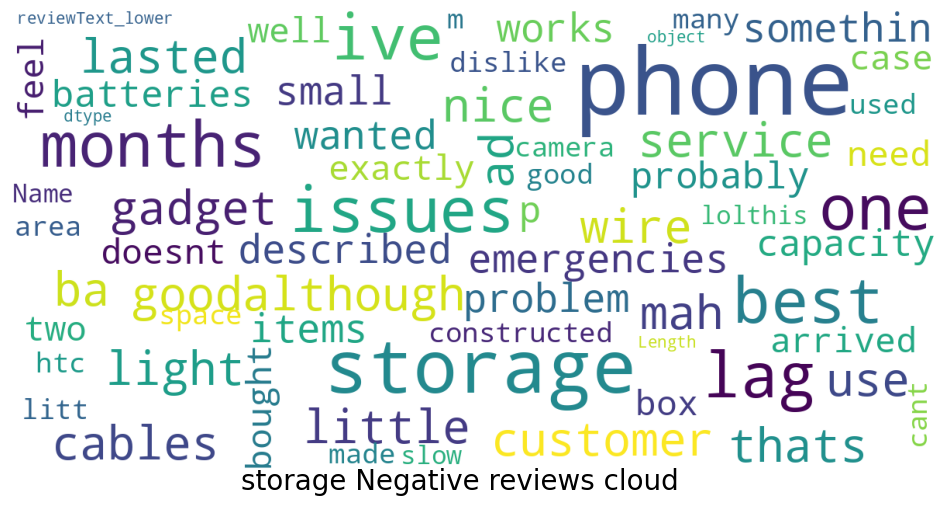

In [ ]:
storagecloud=storagereviews.toPandas()
show_wordcloud(storagecloud['reviewText_lower'],title="storage reviews cloud")
posstoragecloud=storagereviews.filter(spdf.sentiment=='pos')
posstoragecloud=posstoragecloud.toPandas()
show_wordcloud(posstoragecloud['reviewText_lower'],title="storage Positive reviews cloud")
neustoragecloud=storagereviews.filter(spdf.sentiment=='neu')
neustoragecloud=neustoragecloud.toPandas()
show_wordcloud(neustoragecloud['reviewText_lower'],title="storage Neutral reviews cloud")
negstoragecloud=storagereviews.filter(spdf.sentiment=='neg')
negstoragecloud=negstoragecloud.toPandas()
show_wordcloud(negstoragecloud['reviewText_lower'],title="storage Negative reviews cloud")

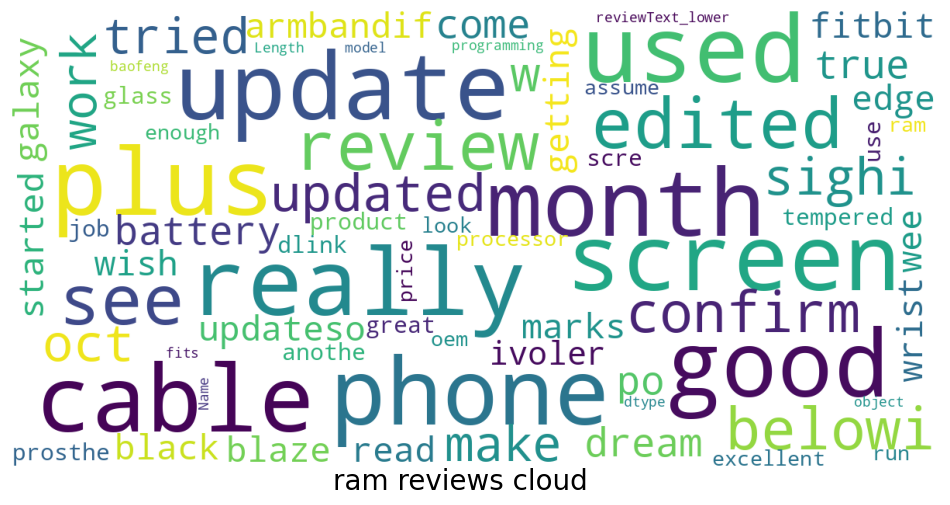

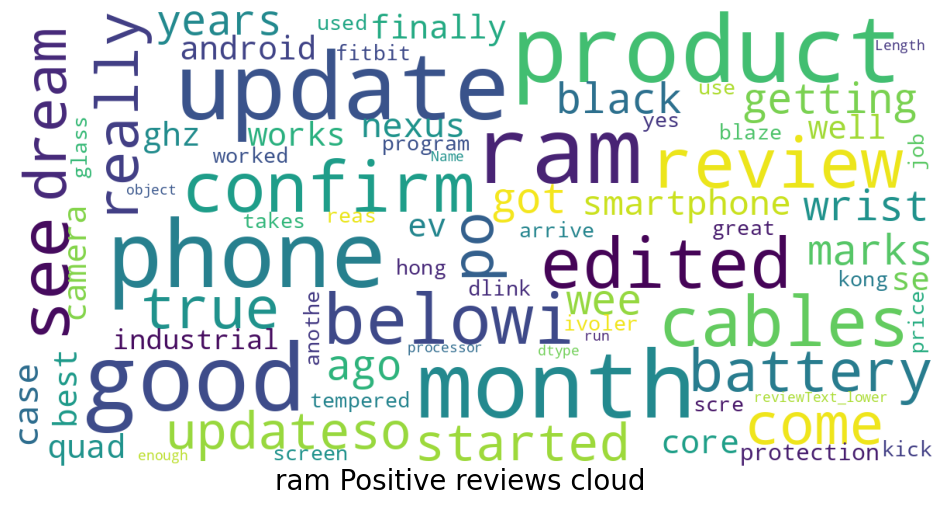

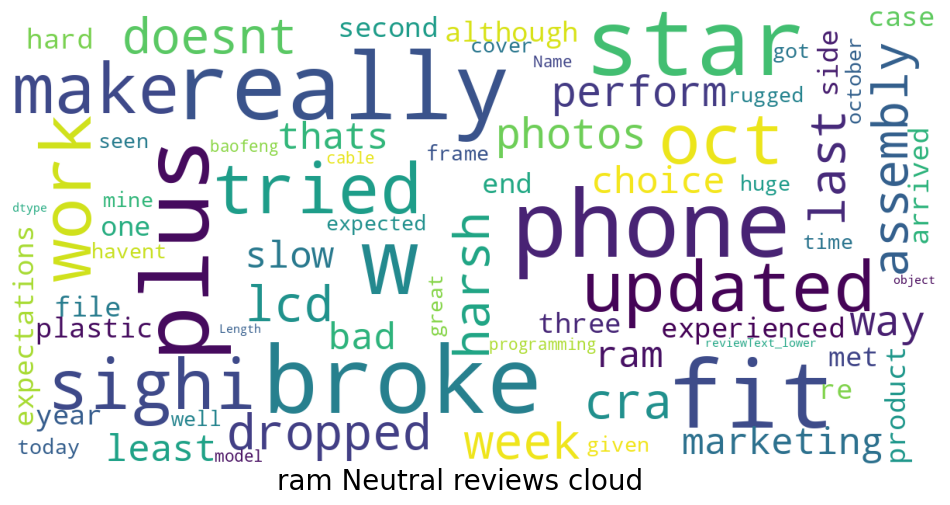

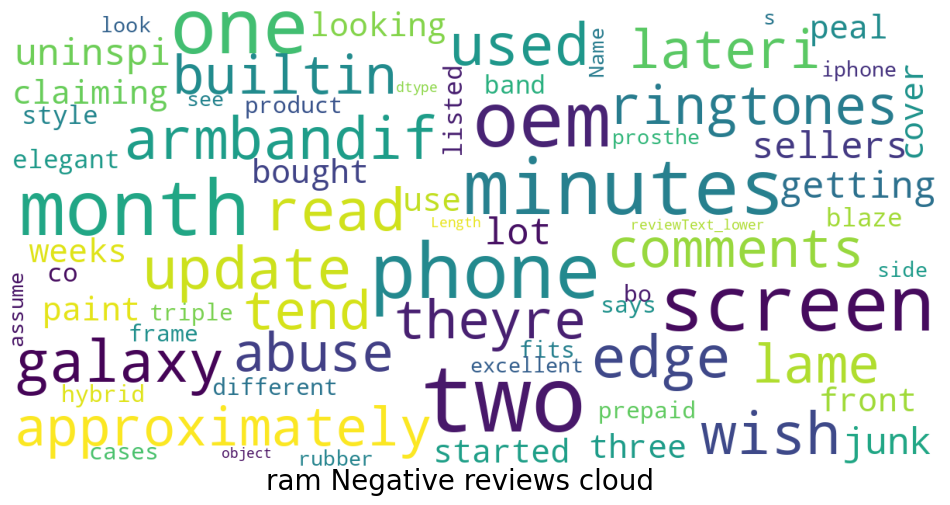

In [ ]:
ramcloud=ramreviews.toPandas()
show_wordcloud(ramcloud['reviewText_lower'],title="ram reviews cloud")
posramcloud=ramreviews.filter(spdf.sentiment=='pos')
posramcloud=posramcloud.toPandas()
show_wordcloud(posramcloud['reviewText_lower'],title="ram Positive reviews cloud")
neuramcloud=ramreviews.filter(spdf.sentiment=='neu')
neuramcloud=neuramcloud.toPandas()
show_wordcloud(neuramcloud['reviewText_lower'],title="ram Neutral reviews cloud")
negramcloud=ramreviews.filter(spdf.sentiment=='neg')
negramcloud=negramcloud.toPandas()
show_wordcloud(negramcloud['reviewText_lower'],title="ram Negative reviews cloud")

In [ ]:
spdf.sort('sentiment_score','overall')

DataFrame[overall: double, reviewText_lower: string, sentiment: string, sentiment_score: double]

In [ ]:
spdf.show()

+-------+--------------------+---------+---------------+
|overall|    reviewText_lower|sentiment|sentiment_score|
+-------+--------------------+---------+---------------+
|    5.0|several variation...|      pos|         0.9898|
|    5.0|protects device n...|      pos|         0.6369|
|    5.0|nice light not se...|      neu|         0.4215|
|    5.0|              galaxy|      neu|            0.0|
|    5.0|separate clips le...|      pos|         0.9862|
|    5.0|great products go...|      pos|         0.9231|
|    5.0|usually strap arm...|      pos|         0.9416|
|    5.0|             perfect|      pos|         0.5719|
|    5.0|             perfect|      pos|         0.5719|
|    4.0|fits great boyfri...|      pos|         0.8625|
|    5.0|                good|      neu|         0.4404|
|    5.0|good case wear te...|      pos|         0.5267|
|    5.0|                love|      pos|         0.6369|
|    5.0|like house protec...|      pos|         0.6486|
|    5.0|  wonderfulwonderful| 

In [ ]:
score=spdf.limit(100).select('sentiment_score').toPandas()
rating=spdf.limit(100).select('overall').toPandas()

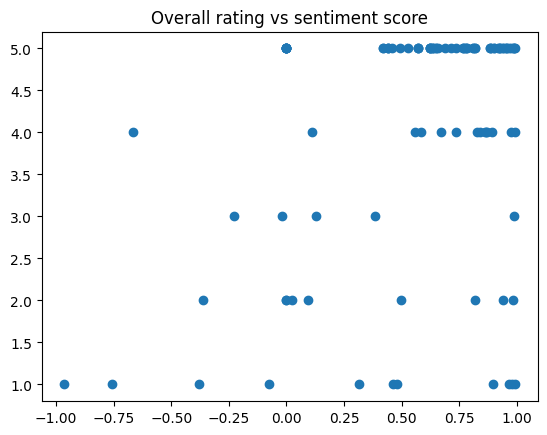

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['agg.path.chunksize'] = 10000
plt.scatter(score,rating)
plt.title("Overall rating vs sentiment score")
plt.show()

In [ ]:
score=camerareviews.limit(100).select('sentiment_score').toPandas()
rating=camerareviews.limit(100).select('overall').toPandas()

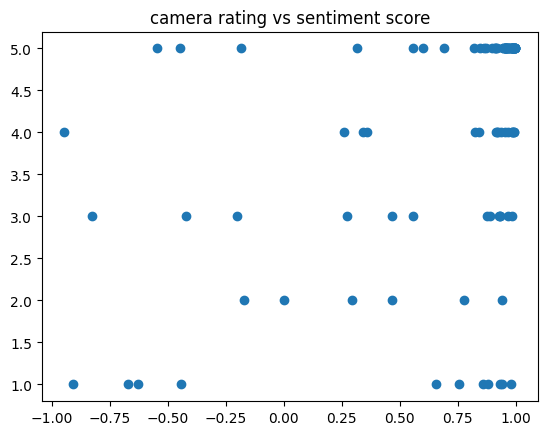

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
#mpl.rcParams['agg.path.chunksize'] = 10000
plt.scatter(score,rating)
plt.title("camera rating vs sentiment score")
plt.show()

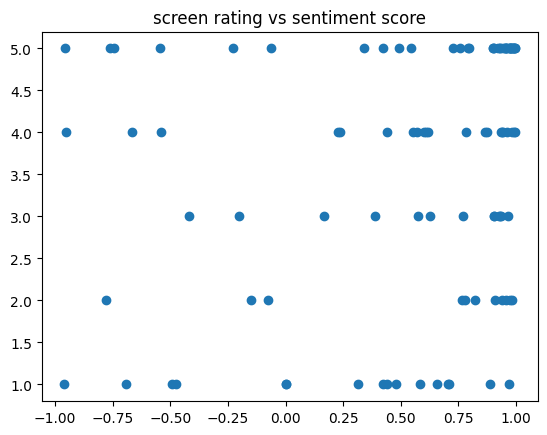

In [ ]:
score=screenreviews.limit(100).select('sentiment_score').toPandas()
rating=screenreviews.limit(100).select('overall').toPandas()
plt.scatter(score,rating)
plt.title("screen rating vs sentiment score")
plt.show()

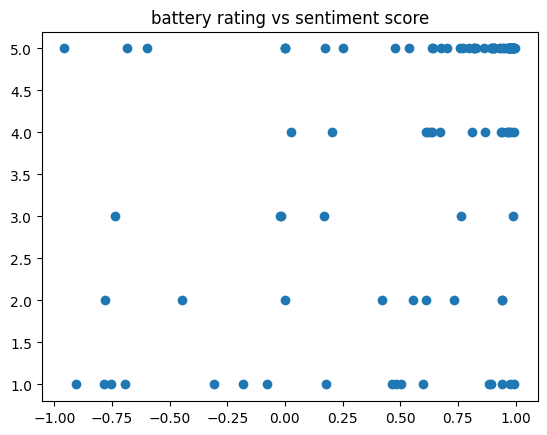

In [ ]:
score=batteryreviews.limit(100).select('sentiment_score').toPandas()
rating=batteryreviews.limit(100).select('overall').toPandas()
plt.scatter(score,rating)
plt.title("battery rating vs sentiment score")
plt.show()

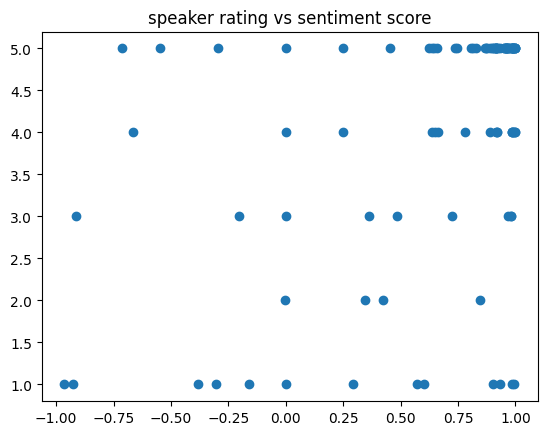

In [ ]:
score=speakerreviews.limit(100).select('sentiment_score').toPandas()
rating=speakerreviews.limit(100).select('overall').toPandas()
plt.scatter(score,rating)
plt.title("speaker rating vs sentiment score")
plt.show()

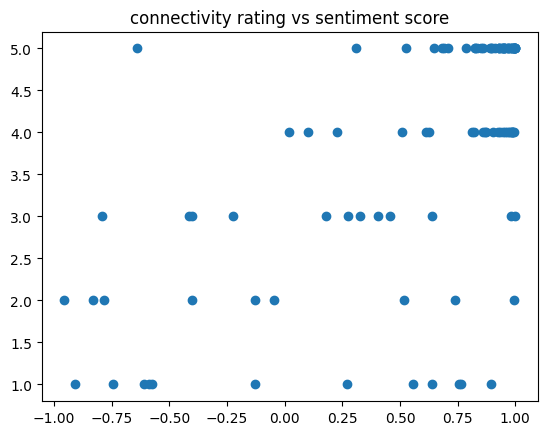

In [ ]:
score=connectivityreviews.limit(100).select('sentiment_score').toPandas()
rating=connectivityreviews.limit(100).select('overall').toPandas()
plt.scatter(score,rating)
plt.title("connectivity rating vs sentiment score")
plt.show()

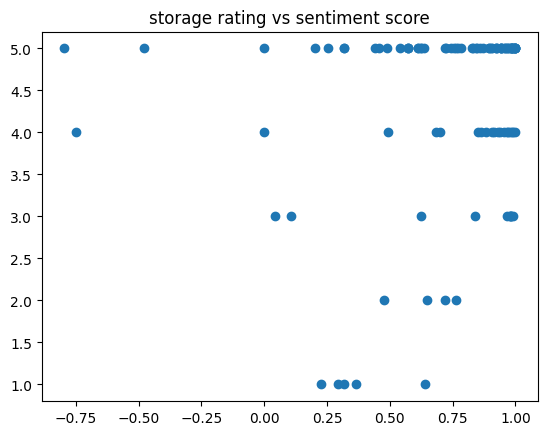

In [ ]:
score=storagereviews.limit(100).select('sentiment_score').toPandas()
rating=storagereviews.limit(100).select('overall').toPandas()
plt.scatter(score,rating)
plt.title("storage rating vs sentiment score")
plt.show()

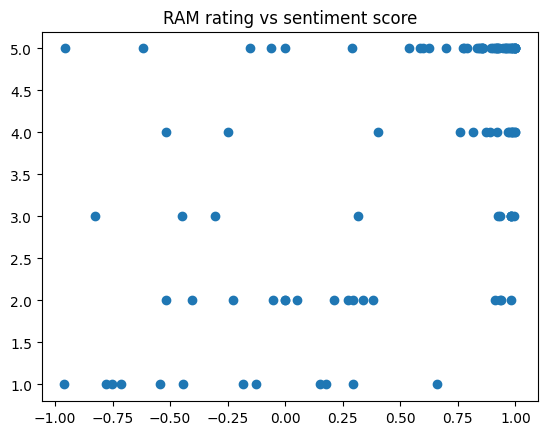

In [ ]:
score=ramreviews.limit(100).select('sentiment_score').toPandas()
rating=ramreviews.limit(100).select('overall').toPandas()
plt.scatter(score,rating)
plt.title("RAM rating vs sentiment score")
plt.show()

In [ ]:
from pyspark.sql.functions import length

spdf=spdf.withColumn('length', length('reviewText_lower'))


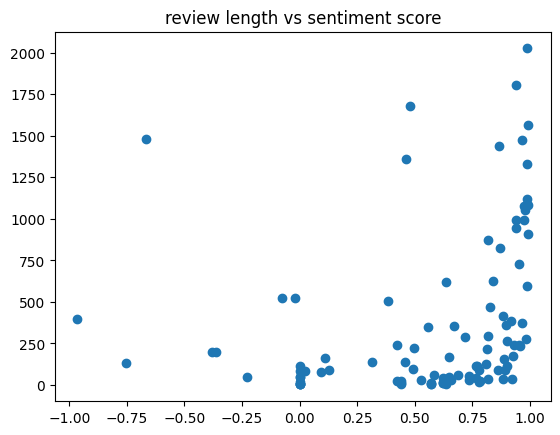

In [ ]:
score=spdf.limit(100).select('sentiment_score').toPandas()
length=spdf.limit(100).select('length').toPandas()
plt.scatter(score,length)
plt.title("review length vs sentiment score")
plt.show()

In [ ]:
spdf.printSchema

<bound method DataFrame.printSchema of DataFrame[overall: double, reviewText_lower: string, sentiment: string, sentiment_score: double]>

In [ ]:
pds=spdf.toPandas()


In [ ]:
pds['category']=np.random.randint(1, 9, len(pds))

In [ ]:
for ind in pds.index:
  if 'camera' in pds['reviewText_lower'][ind]:
    pds['category'][ind]='camera'
  elif 'screen' in pds['reviewText_lower'][ind]:
    pds['category'][ind]='screen'
  elif 'battery' in pds['reviewText_lower'][ind]:
    pds['category'][ind]='battery'
  elif 'speaker' in pds['reviewText_lower'][ind]:
    pds['category'][ind]='speaker'
  elif 'connectivity' in pds['reviewText_lower'][ind]:
    pds['category'][ind]='connectivity'
  elif 'storage' in pds['reviewText_lower'][ind]:
    pds['category'][ind]='storage'
  elif 'ram' in pds['reviewText_lower'][ind]:
    pds['category'][ind]='ram'
  else:
    pds['category'][ind]='NA'

In [ ]:
pds.head()

,overall,reviewText_lower,sentiment,sentiment_score,category
0,5.0,several variations apple products household ye...,pos,0.9898,battery
1,5.0,protects device nicely soft smooth,pos,0.6369,NA
2,5.0,nice light not seen clock,neu,0.4215,NA
3,5.0,galaxy,neu,0.0000,NA
4,5.0,separate clips lens easy attach great quality ...,pos,0.9862,NA


In [ ]:
pds.to_csv("/content/gdrive/MyDrive/PBDM project/category_result.csv")


''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''